In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import netCDF4 as nc

import sys
sys.path.append('/home/z5297792/UNSW-MRes/MRes/SEACOFS_dataset') 
from clim_functions import tilt_distance_Li, plot_tilt_method, bearing


In [2]:
df_eddies = pd.read_pickle('/srv/scratch/z5297792/SEACOFS_26yr_eddy_dataset/DOPPIO_SEACOFS_26yr_50m_vert_check/df_eddies_50m_vert_checked_processed.pkl')
df_tilt = pd.read_pickle('/srv/scratch/z5297792/SEACOFS_26yr_eddy_dataset/DOPPIO_SEACOFS_26yr_50m_vert_check/df_tilt_vert_checked.pkl')
df_eddies = df_eddies.merge(
    df_tilt[['Eddy', 'Day', 'TiltDis', 'TiltDir']],
    how='left',
    left_on=['Eddy', 'Day'],
    right_on=['Eddy', 'Day']
)
df_AE = df_eddies[df_eddies.Cyc=='AE'].copy().dropna()
df_CE = df_eddies[df_eddies.Cyc=='CE'].copy().dropna()
df_eddies


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,q22,Rc,psi0,AR,R,Age,Date,fname,TiltDis,TiltDir
0,1,1462,CE,161.072036,-29.736582,261,274,928.181752,1356.070550,-0.000016,...,1.189040,118.032741,47.992205,1.434563,74.597458,38,1994-01-02,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
1,1,1463,CE,160.982386,-29.745743,260,274,920.121471,1352.093925,-0.000014,...,1.122134,115.905401,50.858737,1.417135,76.449111,38,1994-01-03,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
2,1,1464,CE,160.892701,-29.754904,258,273,912.061191,1348.117301,-0.000012,...,1.055228,113.778061,53.725269,1.413542,78.300764,38,1994-01-04,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
3,1,1465,CE,160.929437,-29.612368,258,276,911.162024,1364.461638,-0.000019,...,0.871468,111.650721,56.591801,1.411879,69.625773,38,1994-01-05,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,33.976810,184.917206
4,1,1466,CE,160.908986,-29.586156,258,277,908.463829,1366.554462,-0.000019,...,0.945071,115.925719,57.471319,1.597888,72.613632,38,1994-01-06,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,30.067059,181.174121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125468,2937,10646,CE,153.739453,-37.488262,181,61,515.983450,302.961328,-0.000026,...,0.978558,61.312206,19.408106,1.110214,55.409919,28,2019-02-24,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,0.752304,4.278123
125469,2937,10647,CE,153.687115,-37.523299,181,60,512.684226,297.695084,-0.000027,...,0.972594,61.305207,19.388829,1.037331,44.896186,28,2019-02-25,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,1.165623,28.370419
125470,2937,10648,CE,153.699708,-37.537452,181,60,514.199660,296.590511,-0.000021,...,0.949624,61.298208,19.369553,1.055789,38.796956,28,2019-02-26,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
125471,2937,10649,CE,153.682657,-37.451789,180,62,510.019363,305.068558,-0.000019,...,0.937880,64.546558,19.604126,1.070344,40.028670,28,2019-02-27,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN


In [3]:
dic_vert = pd.read_pickle('/srv/scratch/z5297792/SEACOFS_26yr_eddy_dataset/DOPPIO_SEACOFS_26yr_50m_vert_check/dic_vert_doppio_50m_vert_checked.pkl')


In [4]:
df_eddies['day_idx'] = (
    df_eddies.groupby('Eddy')['Day']
    .transform(lambda x: x - x.iloc[0])
)
df_large_tilt = df_eddies[df_eddies.TiltDis > 250]
df_large_tilt


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,Rc,psi0,AR,R,Age,Date,fname,TiltDis,TiltDir,day_idx
24768,565,3310,AE,154.480858,-32.390238,154,174,412.168702,860.169002,0.000011,...,67.607528,-24.147359,1.322298,73.659236,38,1999-01-24,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,267.160458,11.972572,33
24769,565,3311,AE,154.390299,-32.408994,151,173,404.725356,855.301043,0.000012,...,67.607528,-24.147359,1.553911,94.332458,38,1999-01-25,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,251.645048,11.625241,34


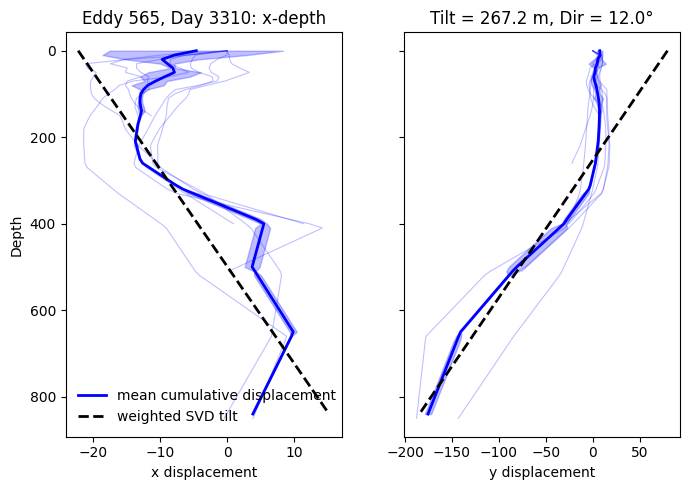

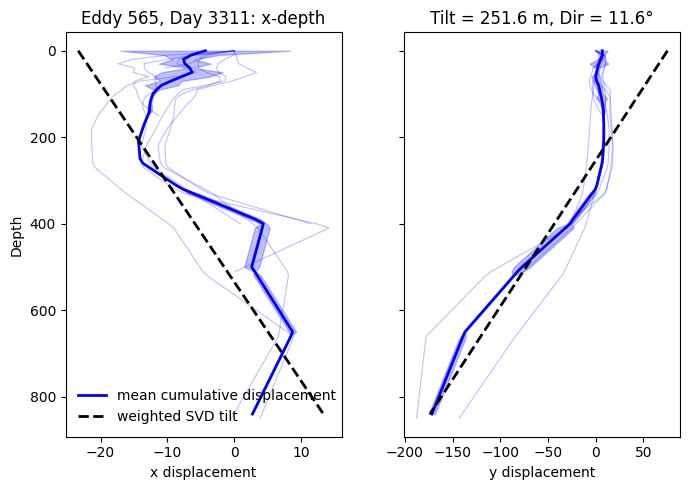

In [5]:
# ks = np.array([10, 50, 70, 100, 10, 130, 140, 150, 180, 200])
# ks += 7

for k in range(len(df_large_tilt)):

    data = df_large_tilt.iloc[k]
    eddy, ref_day = data.Eddy, data.day_idx
    
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=eddy,
        ref_day_idx=ref_day,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )



In [6]:
max_spreads = []
for row in df_eddies.itertuples(index=False):
    try:
        df = dic_vert[f'Eddy{row.Eddy}'][f'Day{row.Day}']

        max_spread, _, _ = tilt_distance_Li(
            df['xc'].values,
            df['yc'].values,
            np.abs(df['Depth'].values),
            zmax=1000
        )
    except Exception:
        max_spread = np.nan
    max_spreads.append(max_spread)

df_eddies['max_spread'] = max_spreads


In [7]:
df_eddies['tdiff'] = (df_eddies.TiltDis - df_eddies.max_spread).abs()


<Axes: >

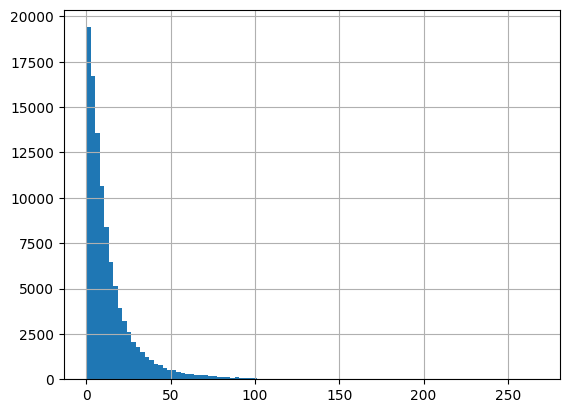

In [8]:
df_eddies['tdiff'].hist(bins=100)


In [9]:
df_large_diff = df_eddies[df_eddies.tdiff > 200]
df_large_diff


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,AR,R,Age,Date,fname,TiltDis,TiltDir,day_idx,max_spread,tdiff
12764,288,2362,CE,159.419589,-31.896377,246,217,841.293940,1072.318491,-0.000032,...,1.539669,20.888618,52,1996-06-20,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,13.601414,54.728535,32,280.862164,267.260750
15074,347,2562,AE,159.002843,-27.678548,215,304,669.967527,1503.702723,0.000030,...,1.211069,38.587349,49,1997-01-06,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,6.838369,37.192535,38,225.415033,218.576663
24768,565,3310,AE,154.480858,-32.390238,154,174,412.168702,860.169002,0.000011,...,1.322298,73.659236,38,1999-01-24,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,267.160458,11.972572,33,57.515402,209.645055
26374,601,3391,CE,159.764352,-34.101172,262,172,937.072679,849.314624,-0.000017,...,1.374980,48.319148,22,1999-04-15,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,14.496233,209.121181,12,220.444648,205.948414
31956,730,3804,AE,157.711291,-31.735130,217,209,681.242848,1033.524041,0.000016,...,1.386372,31.809845,40,2000-06-01,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,103.672040,21.486629,29,321.094661,217.422621
52315,1200,5294,CE,158.507924,-28.006977,208,294,634.297801,1452.417243,-0.000013,...,1.125243,9.743746,24,2004-06-30,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,23.970731,239.015777,3,238.617141,214.646410
114539,2678,9743,CE,153.742610,-38.969831,192,30,562.923885,147.271297,-0.000026,...,1.666048,21.351782,43,2016-09-04,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,3.839977,248.404861,17,211.005369,207.165392


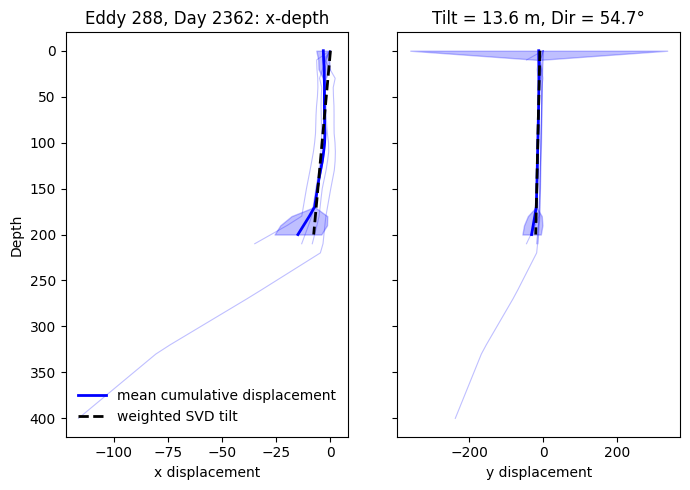

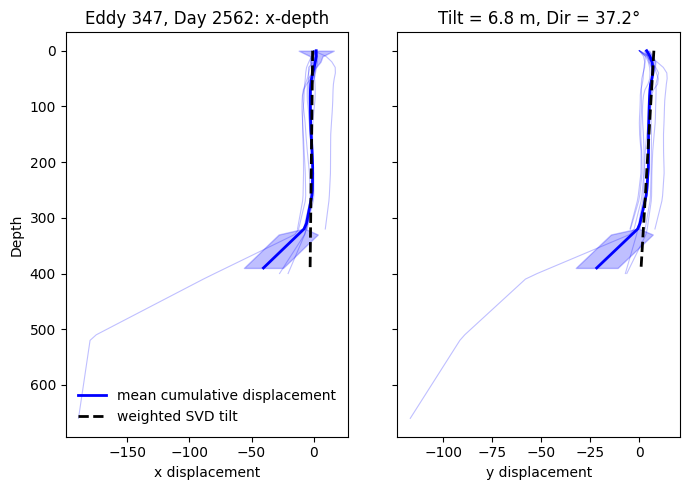

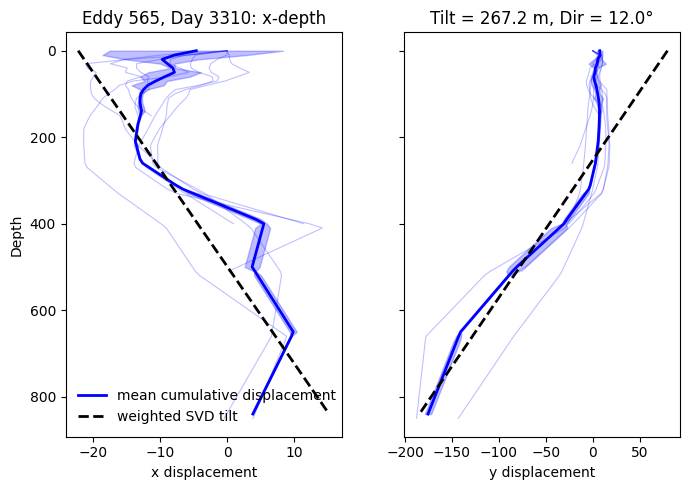

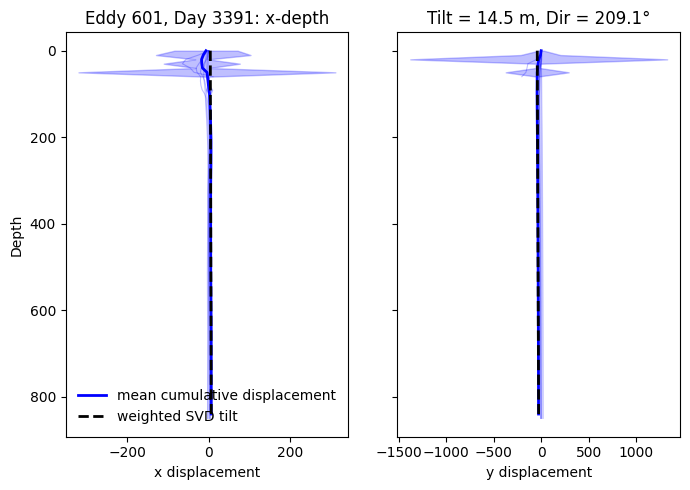

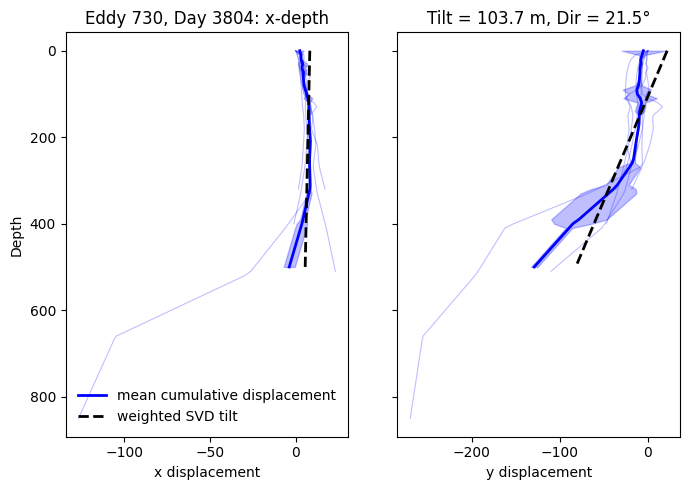

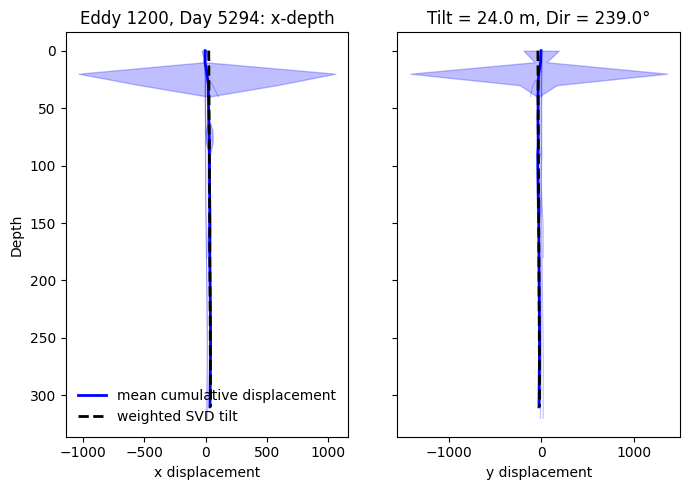

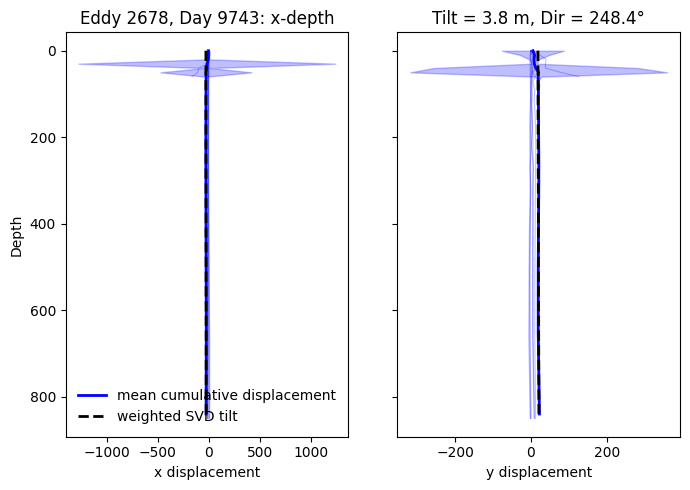

In [10]:
for k in range(len(df_large_diff)):

    data = df_large_diff.iloc[k]
    eddy, ref_day = data.Eddy, data.day_idx
    
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=eddy,
        ref_day_idx=ref_day,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )
    

<Axes: >

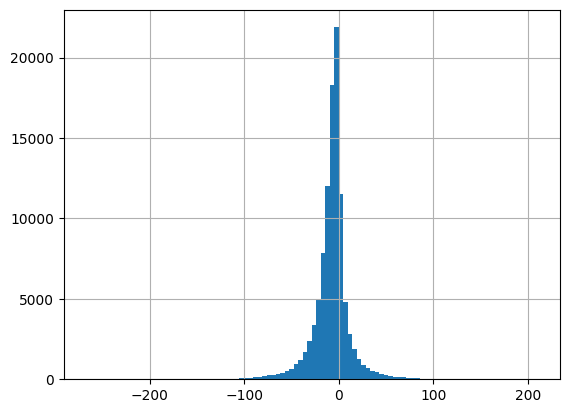

In [11]:
df_eddies['tvecdiff'] = df_eddies.TiltDis - df_eddies.max_spread
df_eddies.tvecdiff.hist(bins=100)


In [12]:
df_big_tilt_to_spread = df_eddies[df_eddies.tvecdiff > 100]
df_big_tilt_to_spread


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,R,Age,Date,fname,TiltDis,TiltDir,day_idx,max_spread,tdiff,tvecdiff
1245,25,1509,CE,159.811221,-30.451289,245,251,833.179639,1238.271111,-0.000019,...,55.295499,65,1994-02-18,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,151.164797,96.800656,5,15.711227,135.453570,135.453570
1942,35,1570,CE,155.619549,-37.953551,219,63,689.221770,310.964584,-0.000005,...,48.392665,44,1994-04-20,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,106.121497,51.003403,34,0.000000,106.121497,106.121497
1943,35,1571,CE,155.542159,-37.932344,217,63,682.045883,310.858418,-0.000005,...,45.187181,44,1994-04-21,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,106.121497,51.003403,35,0.000000,106.121497,106.121497
2558,45,1624,AE,159.380195,-28.259850,226,295,724.239442,1455.266972,0.000023,...,36.002215,41,1994-06-13,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,211.819558,77.990360,31,69.261036,142.558521,142.558521
2689,50,1619,CE,158.966971,-30.840595,234,237,767.617865,1169.148754,-0.000014,...,59.414673,38,1994-06-08,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,151.804479,93.072170,6,36.586527,115.217952,115.217952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114317,2672,9729,AE,154.917616,-31.401477,155,198,417.708300,977.615078,0.000013,...,45.501822,25,2016-08-21,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,141.625093,28.314842,18,11.068767,130.556327,130.556327
120881,2833,10291,AE,155.482932,-36.052277,205,103,619.549472,507.516003,0.000026,...,43.972146,63,2018-03-06,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,194.239172,306.579360,44,67.287301,126.951871,126.951871
120882,2833,10292,AE,155.469881,-36.178669,205,100,622.356794,493.789549,0.000024,...,42.192377,63,2018-03-07,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,168.271885,303.484039,45,34.874864,133.397021,133.397021
120883,2833,10293,AE,155.429989,-36.257211,205,98,621.362067,484.275766,0.000025,...,44.394311,63,2018-03-08,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,139.397928,301.870144,46,28.884841,110.513087,110.513087


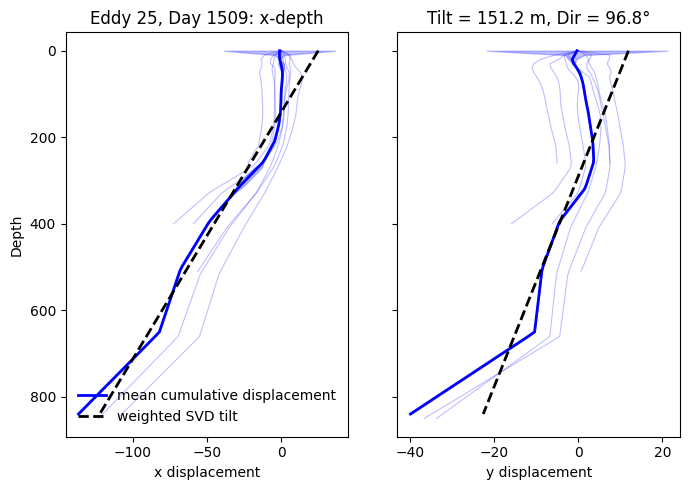

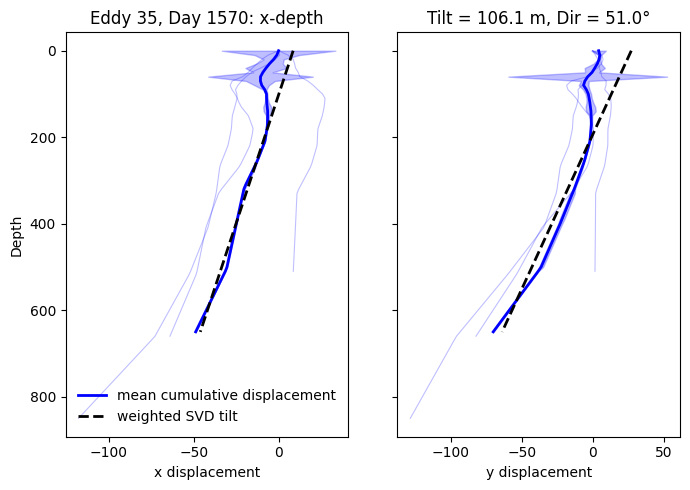

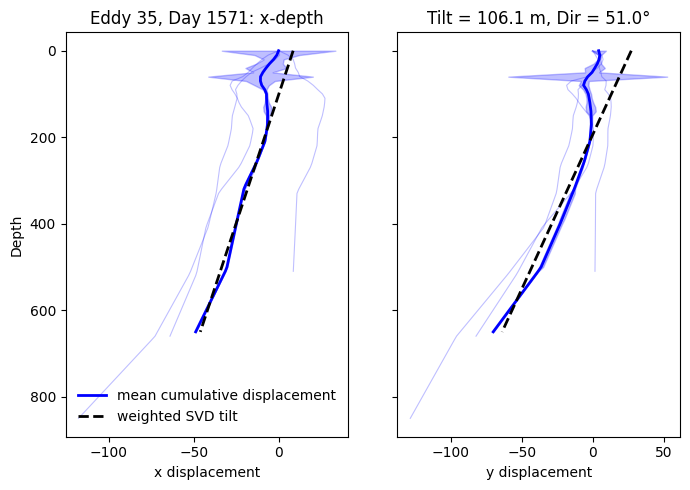

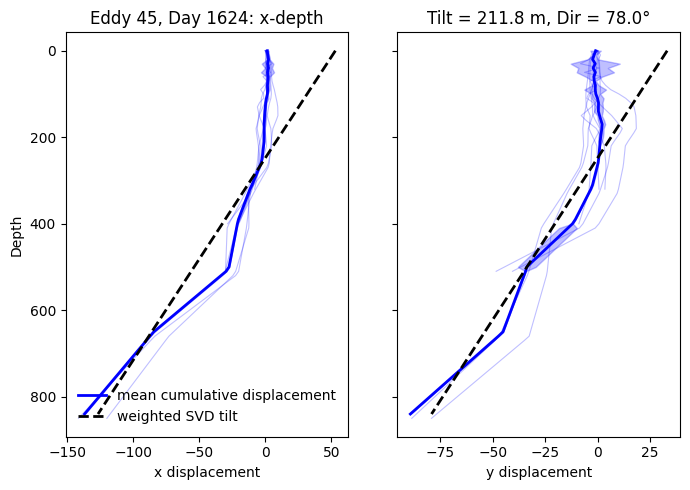

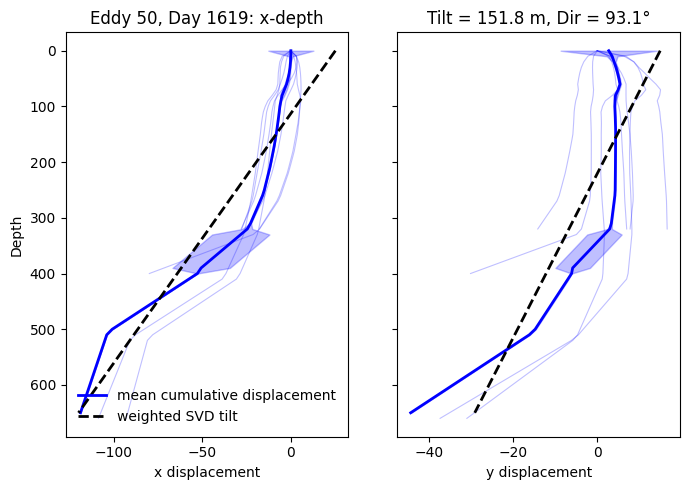

...

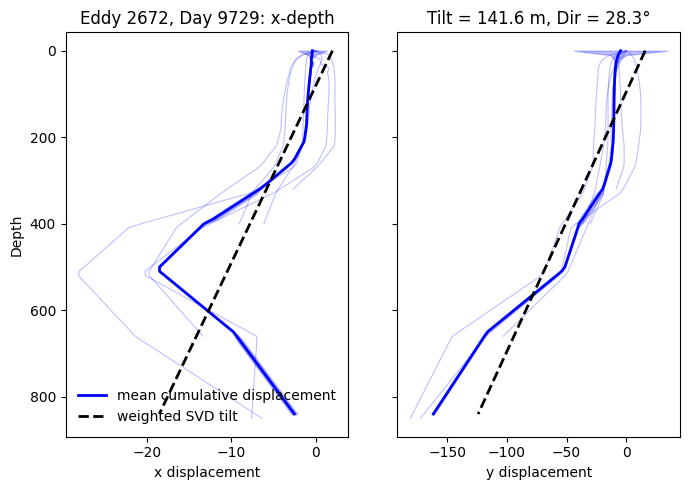

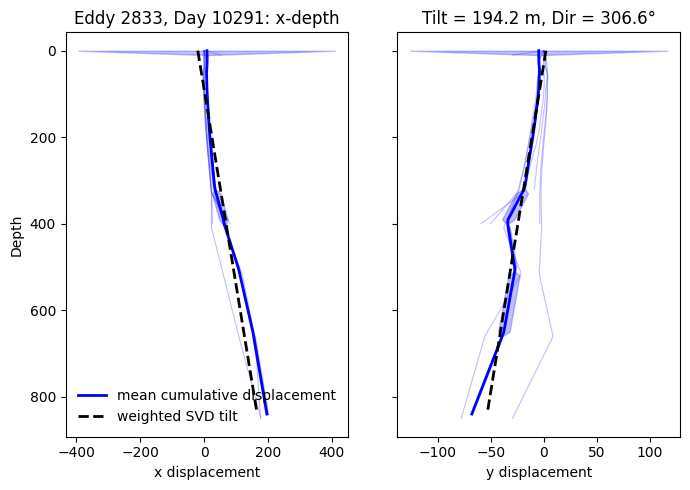

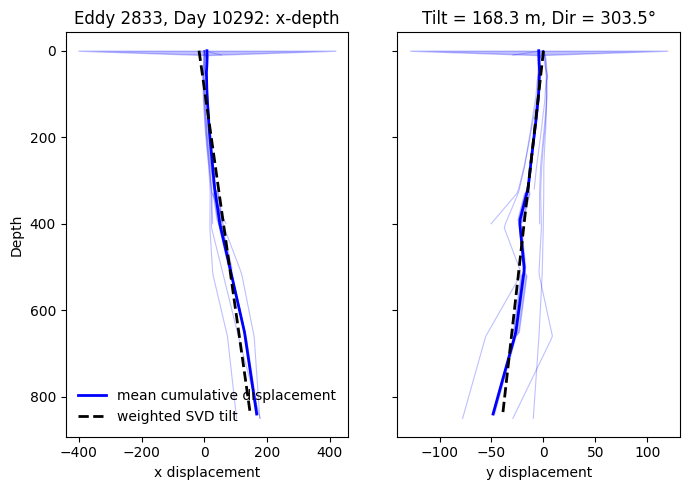

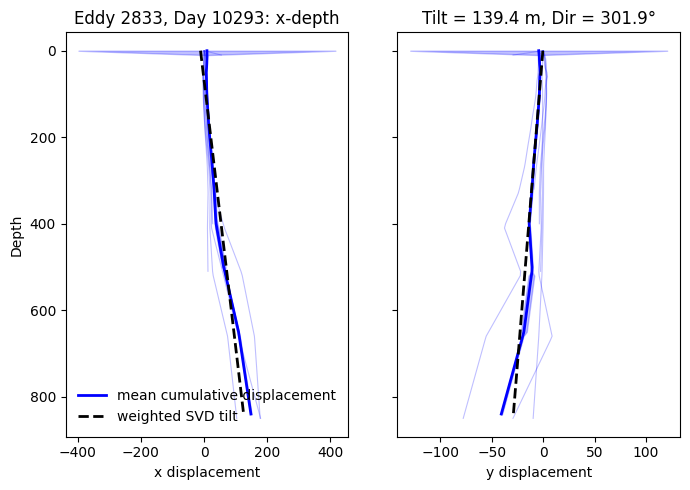

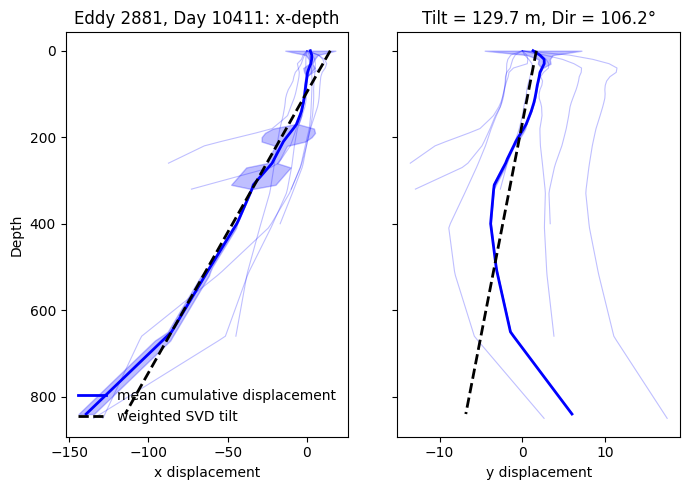

In [13]:
for k in range(len(df_big_tilt_to_spread)):

    data = df_big_tilt_to_spread.iloc[k]
    eddy, ref_day = data.Eddy, data.day_idx
    
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=eddy,
        ref_day_idx=ref_day,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )
    

In [14]:
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=627,
        ref_day_idx=50,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )


Eddy 627: ref_day_idx outside valid compute_tilt_data range.


(None,
 None,
 Empty DataFrame
 Columns: []
 Index: [])